# Рынок заведений общественного питания Москвы

## Описание проекта

## Задача проекта
Исследование рынка общественного питания на основе открытых данных, подготовка презентации для инвесторов

## Этапы проекта

1. [Загрузка данных и изучение общей информации;](#download)
2. [Предобработка данных](#preprocessing)
3. [Анализ данных](#analysis)
4. [Детализация исследования](#detailing)
5. [Презентация](#presentation)

## Загрузка данных и изучение общей информации
<a id="download"></a>

1) **Импортируем необходимые библиотеки.**

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go 
import plotly.express as px
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import json

In [3]:
sns.set_style('dark')
sns.set_palette('deep')

2) **Считываем файл. Смотрим общую информацию.**

In [4]:
path = '' # вставьте расположение файла с данными на вашем компьютере
data = pd.read_csv(path + '') # удалил

In [5]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В некоторых столбцах для удобства необходимо изменить тип данных.

Представлено 8 406 заведений. Есть информация о расположении заведения, графике работы, рейтинге, средних ценах, количестве посадочных мест. Также известно, является заведение сетевым или нет.

## Предобработка данных
<a id="preprocessing"></a>

1) **Проверим, есть ли в данных дубликаты.**

In [7]:
data.duplicated().sum()

0

Дубликатов нет.

2) **Ищем и обрабатываем пропуски в данных.**

Пропуски в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. В столбцах со строковым типом данных заменим пропуски на "нет информации". В столбцах с числовым типом данных вместо пропусков подставим "-1", чтобы не изменять тип данных.

In [8]:
data['hours'] = data['hours'].fillna('нет информации')
data['price'] = data['price'].fillna('нет информации')
data['avg_bill'] = data['avg_bill'].fillna('нет информации')

columns = ['middle_avg_bill', 'middle_coffee_cup', 'chain', 'seats']
for column in columns:
    data[column] = data[column].fillna(-1)

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              8406 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              8406 non-null   object 
 9   avg_bill           8406 non-null   object 
 10  middle_avg_bill    8406 non-null   float64
 11  middle_coffee_cup  8406 non-null   float64
 12  chain              8406 non-null   int64  
 13  seats              8406 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В данных больше нет пропусков. Можно переходить к следующему этапу.

3) **Изменим типы данных.**

Приведем столбцы middle_avg_bill, middle_coffee_cup, seats к целочисленному типу данных. Значения в столбце chain заменим на более понятные.

In [9]:
#data['middle_avg_bill'] = pd.to_numeric(data['middle_avg_bill'], downcast='integer')

columns = ['middle_avg_bill', 'middle_coffee_cup', 'seats']
for column in columns:
    data[column] = pd.to_numeric(data[column], downcast='integer')

data['chain'] = data['chain'].apply(lambda x: 'сетевое' if x==1 else 'не сетевое')

In [10]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,нет информации,нет информации,-1,-1,не сетевое,-1
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550,-1,не сетевое,4
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000,-1,не сетевое,45
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,нет информации,Цена чашки капучино:155–185 ₽,-1,170,не сетевое,-1
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500,-1,сетевое,148


In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              8406 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              8406 non-null   object 
 9   avg_bill           8406 non-null   object 
 10  middle_avg_bill    8406 non-null   int32  
 11  middle_coffee_cup  8406 non-null   int16  
 12  chain              8406 non-null   object 
 13  seats              8406 non-null   int16  
dtypes: float64(3), int16(2), int32(1), object(8)
memory usage: 788.2+ KB


Типы данных изменены. Дальше работать с ними будет гораздо удобнее.

4) **Создадим столбец street с названиями улиц.**

In [12]:
data['street'] = data['address'].apply(lambda x: x.split(', ')[1])
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,нет информации,нет информации,-1,-1,не сетевое,-1,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550,-1,не сетевое,4,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000,-1,не сетевое,45,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,нет информации,Цена чашки капучино:155–185 ₽,-1,170,не сетевое,-1,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500,-1,сетевое,148,Правобережная улица
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,нет информации,-1,-1,не сетевое,-1,Ижорская улица
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199,-1,не сетевое,45,Клязьминская улица
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250,-1,не сетевое,45,Клязьминская улица
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500,-1,не сетевое,79,Дмитровское шоссе
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100,-1,не сетевое,65,Ангарская улица


5) **Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7).**

In [13]:
data['is_24/7'] = data['hours'].apply(lambda x: True if x=='ежедневно, круглосуточно' else False)
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,нет информации,нет информации,-1,-1,не сетевое,-1,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550,-1,не сетевое,4,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000,-1,не сетевое,45,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,нет информации,Цена чашки капучино:155–185 ₽,-1,170,не сетевое,-1,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500,-1,сетевое,148,Правобережная улица,False


6) **Проверим данные на наличие аномалий.**

array([[<AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'lng'}>],
       [<AxesSubplot:title={'center':'rating'}>,
        <AxesSubplot:title={'center':'middle_avg_bill'}>],
       [<AxesSubplot:title={'center':'middle_coffee_cup'}>,
        <AxesSubplot:title={'center':'seats'}>]], dtype=object)

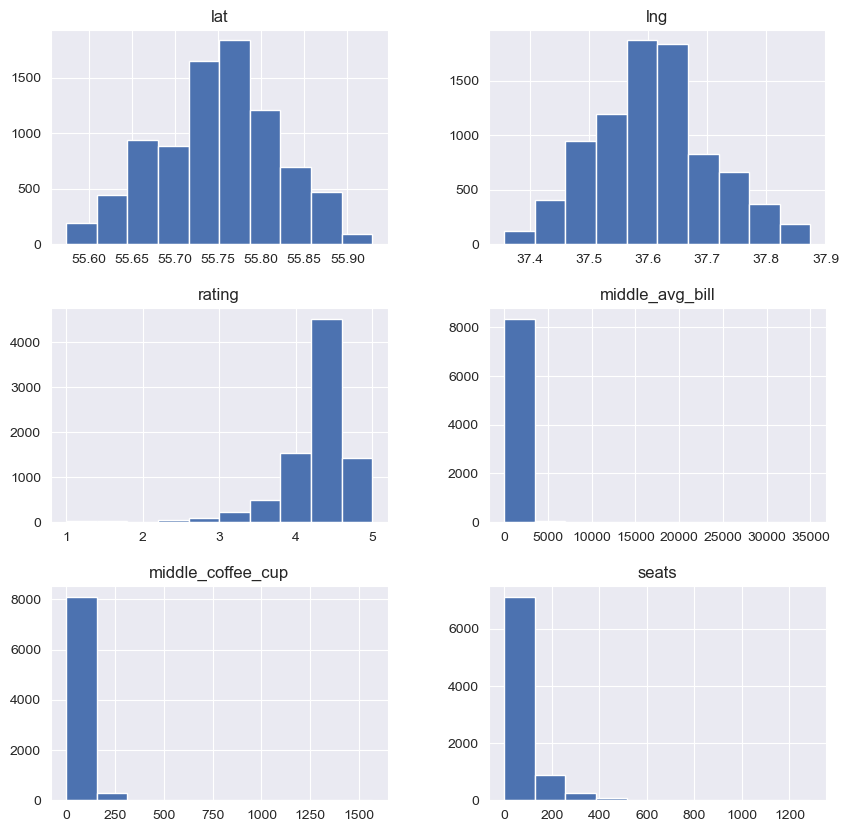

In [14]:
columns = ['lat', 'lng', 'rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats'] # в этих столбцах могут встретиться аномалии
data[columns].hist(figsize=(10,10))

Подозрительно выглядят средний чек в 35 000 рублей, чашка кофе за 1500 рублей и 1200 посадочных мест. Посмотрим, в каких заведениях встречаются такие показатели.

In [15]:
data[data['middle_avg_bill']>10000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
730,Чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000,-1,не сетевое,49,Дмитровское шоссе,False
7177,Кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.657450,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000,-1,не сетевое,100,Каширское шоссе,True


Чойхона на Дмитровском шоссе больше не работает, а по отзывам посетителей цены там были невысокие и доступные. Кафе на Каширском шоссе расположено на закрытой территории рядом с онкологической больницей, поэтому сюда ходит персонал больницы и больные. По отзывам в кафе этим пользуются и сильно завышают цены. Это исключительный случай, и на него не стоит ориентироваться.<br>
Можем исключить эти заведения из последующего анализа.

In [16]:
data = data.query('middle_avg_bill<=10000')

Разберемся с чашкой кофе.

In [17]:
data[data['middle_coffee_cup']>500]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,-1,1568,сетевое,48,Большая Семёновская улица,False


Здесь ошибка в данных. Цена на кофе по меню заведения 230-290 рублей. Тогда средняя цена 260 рублей. Исправим ошибку.

In [18]:
data.loc[2859, 'avg_bill'] = 'Цена чашки капучино:230–290 ₽'
data.loc[2859, 'middle_coffee_cup'] = 260

Теперь посмотрим на заведение с большим количеством посадочных мест.

In [19]:
data[data['seats']>1000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
2713,Ваня и Гоги,"бар,паб","Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 11:00–06:00",55.789842,37.750282,4.2,высокие,Средний счёт:1000–2500 ₽,1750,-1,не сетевое,1040,Измайловское шоссе,False
2722,Маргарита,быстрое питание,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 10:00–22:00",55.789527,37.752004,4.3,нет информации,нет информации,-1,-1,сетевое,1040,Измайловское шоссе,False
2770,Шоколадница,кофейня,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"пн-ср 11:00–23:00; чт 11:00–00:00; пт,сб 11:00...",55.789903,37.749822,4.1,нет информации,нет информации,-1,-1,сетевое,1040,Измайловское шоссе,False
2966,Матрешка,кафе,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,нет информации,55.789867,37.749656,4.0,нет информации,нет информации,-1,-1,не сетевое,1040,Измайловское шоссе,False
4231,РестоБар Argomento,столовая,"Москва, Кутузовский проспект, 41, стр. 1",Западный административный округ,"ежедневно, 12:00–23:00",55.738237,37.531819,4.2,высокие,Средний счёт:2500–5000 ₽,3750,-1,не сетевое,1200,Кутузовский проспект,False
6518,DelonixCafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,Средний счёт:1500–2000 ₽,1750,-1,не сетевое,1288,проспект Вернадского,True
6524,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500,-1,сетевое,1288,проспект Вернадского,False
6574,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,нет информации,нет информации,-1,-1,сетевое,1288,проспект Вернадского,False
6641,One Price Coffee,кофейня,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665129,37.478635,4.3,нет информации,нет информации,-1,-1,сетевое,1288,проспект Вернадского,False
6658,ГудБар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,Средний счёт:700 ₽,700,-1,не сетевое,1288,проспект Вернадского,False


In [20]:
len(data[data['seats']>1000])

16

У нас в данных 16 заведений, где более 1000 посадочных мест. По фотографиям некоторых видно, что заведения небольшие. Кажется, что в данных могут быть ошибки. Для простоты удалим эти строки из датафрейма, к тому же они имеют пропуски в других столбцах.

In [21]:
data = data.query('seats<1000')

Теперь проверим другую аномалию в данных: количество мест равно 0.

In [22]:
data[data['seats']==0]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
84,Meat Doner Kebab,булочная,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896987,37.608126,4.5,нет информации,Средний счёт:300 ₽,300,-1,не сетевое,0,улица Лескова,True
177,Арамье,булочная,"Москва, улица 800-летия Москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.879392,37.556832,4.0,нет информации,нет информации,-1,-1,сетевое,0,улица 800-летия Москвы,False
196,Донер-Шашлык,ресторан,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896962,37.608300,4.5,нет информации,нет информации,-1,-1,не сетевое,0,улица Лескова,True
203,Тандыр № 1,кафе,"Москва, улица Лескова, 22Г",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.895615,37.611049,4.0,нет информации,нет информации,-1,-1,сетевое,0,улица Лескова,True
211,Неаполитан пицца,кафе,"Москва, улица Пришвина, 23",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.885416,37.604650,4.3,нет информации,нет информации,-1,-1,не сетевое,0,улица Пришвина,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8118,Бико,булочная,"Москва, улица Симоновский Вал, 13, стр. 3",Юго-Восточный административный округ,"ежедневно, 08:00–20:00",55.723340,37.664252,1.3,нет информации,нет информации,-1,-1,не сетевое,0,улица Симоновский Вал,False
8168,Чайхана УЧ Кудук,кофейня,"Москва, улица Симоновский Вал, 26, корп. 1",Южный административный округ,"ежедневно, 09:00–00:00",55.718663,37.662887,4.3,нет информации,нет информации,-1,-1,не сетевое,0,улица Симоновский Вал,False
8172,Масса кофе,кофейня,"Москва, Холодильный переулок, 2",Южный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–20:00",55.709713,37.624388,4.3,средние,Цена чашки капучино:100–210 ₽,-1,155,не сетевое,0,Холодильный переулок,False
8336,Сочная шаурма в Кузьминках,быстрое питание,"Москва, Волгоградский проспект, 102",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.703834,37.773831,3.9,нет информации,Средний счёт:120–130 ₽,125,-1,не сетевое,0,Волгоградский проспект,True


Чтобы избавиться от этой аномалии вместо нулей поставим медианные значения по категориям.

In [23]:
def fill_seats(category, data=data):
    #return data[data['category']==category]['seats'].astype('int')
    return data.loc[(data['seats']>0)&(data['category']==category)]['seats'].median()

data['seats'] = data[['category', 'seats']].apply(lambda x: fill_seats(x['category']).astype('int') if x['seats']==0 else x['seats'] ,axis=1)

Мы выполнили предобработку данных. Проверили датафрейм на дубликаты, обработали пропуски, изменили типы данных, где необходимо. Также создали новые столбцы "street" и "is_24/7" для удобной работы с данными. Исследовали аномальные значения в столбцах и избавились от них. Теперь можно приступить к анализу данных.

## Анализ данных
<a id="analysis"></a>

1) **Посмотрим, какие категории заведений представлены в данных.**

In [24]:
category_count = pd.pivot_table(data, index='category', values='name', aggfunc='count').rename(columns={'name':'count'}).\
    sort_values('count', ascending=False).reset_index()

In [25]:
category_count

,category,count
0,кафе,2375
1,ресторан,2038
2,кофейня,1410
3,"бар,паб",761
4,пиццерия,632
5,быстрое питание,602
6,столовая,314
7,булочная,256


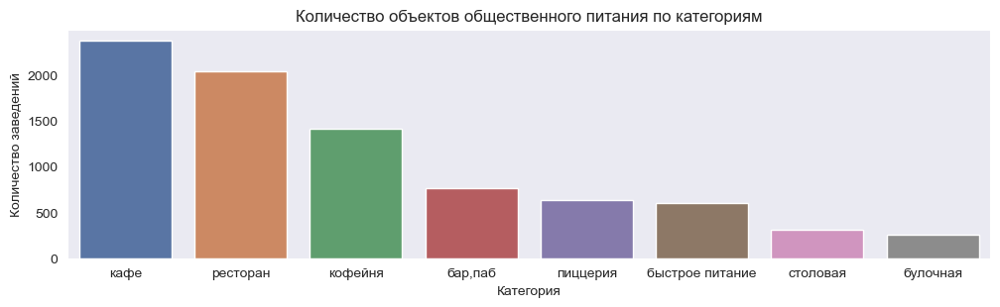

In [26]:
plt.figure(figsize=(12, 3)) 

fig = sns.barplot(x='category', y='count', data=category_count)

plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.title('Количество объектов общественного питания по категориям')

plt.show(fig)

В Москве больше всего кафе и ресторанов. Меньше всего торопятся открывать булочные и столовые.

2) **Исследуем количество посадочных мест по категориям.**

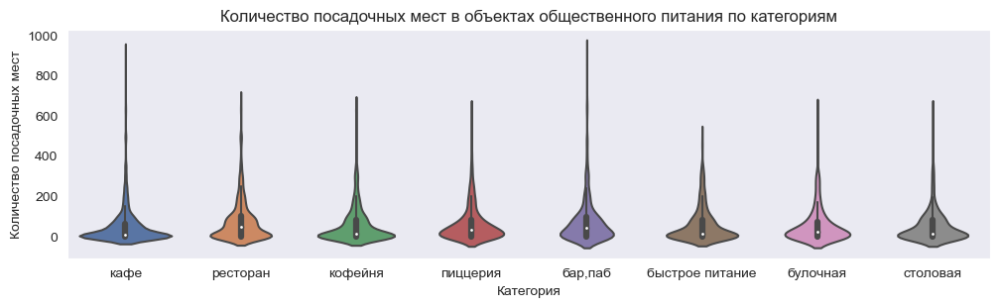

In [27]:
plt.figure(figsize=(12, 3)) 

fig = sns.violinplot(x='category', y='seats', data=data)

plt.xlabel('Категория')
plt.ylabel('Количество посадочных мест')
plt.title('Количество посадочных мест в объектах общественного питания по категориям')

plt.show(fig)

Видно, что в категориях "кафе" и "бар, паб" встречаются заведения вплоть до 1000 посадочных мест, если верить данным. Увеличим масштаб, чтобы посмотреть на квартили.

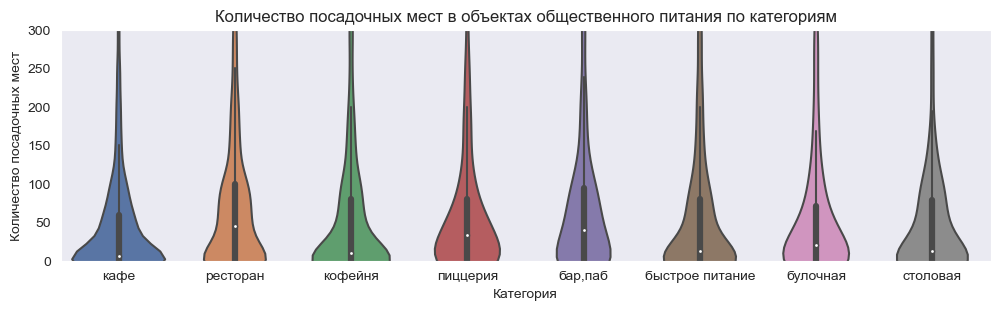

In [28]:
plt.figure(figsize=(12, 3)) 

fig = sns.violinplot(x='category', y='seats', data=data)

plt.xlabel('Категория')
plt.ylabel('Количество посадочных мест')
plt.title('Количество посадочных мест в объектах общественного питания по категориям')
plt.ylim(0,300)

plt.show(fig)

По медианному значению самыми вместительными являются рестораны и бары. В среднем около 50 мест, а максимальные значения доходят до 250 мест.

3) **Рассмотрим соотношение сетевых и несетевых заведений.**

In [29]:
chain_count = pd.pivot_table(data, index='chain', values='name', aggfunc='count').rename(columns={'name':'count'}).\
    sort_values('count', ascending=False).reset_index()

In [30]:
fig = px.pie(chain_count, names='chain', values='count')
fig.update_layout(title='Число сетевых и не сетевых заведений в Москве', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=500)

fig.show()

Видно, что несетевых заведений больше, чем сетевых. Соотношение 60 на 40 процентов.

4) **Посмотрим, какие категории заведений чаще являются сетевыми.**

In [31]:
category_chain = pd.pivot_table(data, index='category', columns='chain', values='name', aggfunc='count').reset_index()
category_chain['chain_share, %'] = round(category_chain['сетевое']*100/(category_chain['сетевое'] + category_chain['не сетевое']),2)
category_chain = category_chain.sort_values('chain_share, %', ascending=False)
category_chain

chain,category,не сетевое,сетевое,"chain_share, %"
1,булочная,99,157,61.33
5,пиццерия,303,329,52.06
4,кофейня,692,718,50.92
2,быстрое питание,371,231,38.37
6,ресторан,1311,727,35.67
3,кафе,1597,778,32.76
7,столовая,226,88,28.03
0,"бар,паб",592,169,22.21


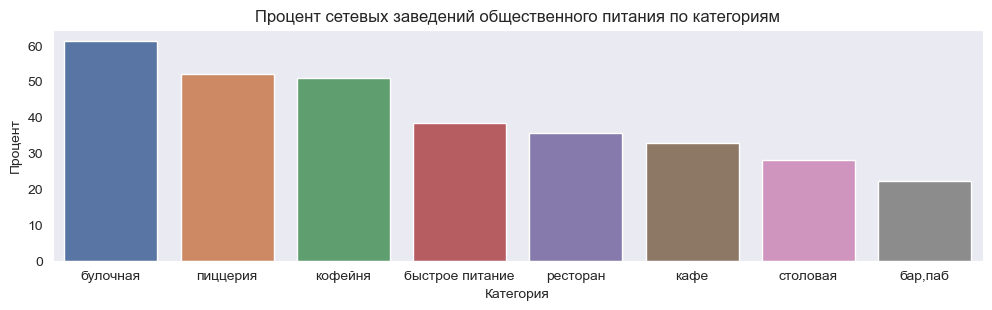

In [32]:
plt.figure(figsize=(12, 3)) 

fig = sns.barplot(x='category', y='chain_share, %', data=category_chain)

plt.xlabel('Категория')
plt.ylabel('Процент')
plt.title('Процент сетевых заведений общественного питания по категориям')

plt.show(fig)

Целых 60% булочных в Москве являются сетевыми. Также половина пиццерий и кофейнь. А вот бары являются сетевыми только в 22% заведений.

5) **Найдем топ-15 популярных сетей в Москве.**

In [33]:
data_for_chain = pd.DataFrame(data[data['chain']=='сетевое'].groupby(['name', 'category'], as_index=True)['address'].count())\
    .sort_values('address', ascending=False).reset_index()
data_for_chain.columns = ['name', 'category', 'count']
data_for_chain = data_for_chain.head(15)
data_for_chain.loc[8,'name'] = 'Братья Караваевы' #сократим название, чтобы красиво отобразить на графике

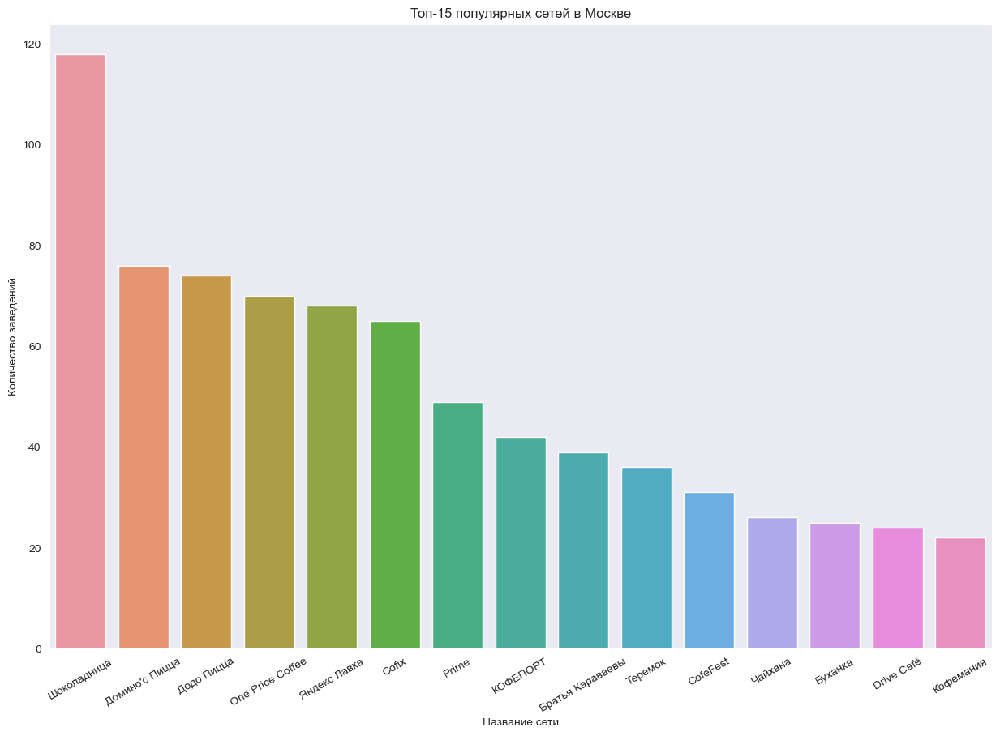

In [34]:
plt.figure(figsize=(15, 10)) 

fig = sns.barplot(x='name', y='count', data=data_for_chain)

plt.xlabel('Название сети')
plt.ylabel('Количество заведений')
plt.title('Топ-15 популярных сетей в Москве')
fig.set_xticklabels(fig.get_xticklabels(),rotation = 30)

plt.show(fig)

Всем известная "Шоколадница" с большим отрывов возглавляет рейтинг. Около 120 точек. Замыкают топ "Буханка", "Drive Cafe", "Кофемания". У них чуть больше 20 заведений.

6) **Посмотрим, какие административные районы Москвы присутствуют в датасете.**

In [35]:
pivot_district = pd.pivot_table(data, index='district', columns='category', values='name', aggfunc='count').reset_index()
#pivot_district['всего'] = pivot_district.loc[:, 'бар,паб': 'столовая'].apply(lambda x: sum(x), axis=1)
pivot_district['district'] = ['ВАО', 'ЗАО', 'САО', 'СВАО', 'СЗАО', 'ЦАО', 'ЮВАО', 'ЮЗАО', 'ЮАО']
pivot_district

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,ВАО,52,25,70,271,104,72,160,40
1,ЗАО,48,37,62,237,148,70,214,23
2,САО,67,39,58,235,193,77,189,41
3,СВАО,63,28,82,269,159,68,182,40
4,СЗАО,23,12,30,115,62,40,109,18
5,ЦАО,364,50,87,464,428,113,670,66
6,ЮВАО,38,13,67,282,89,55,145,25
7,ЮЗАО,38,27,61,238,96,64,168,17
8,ЮАО,68,25,85,264,131,73,201,44


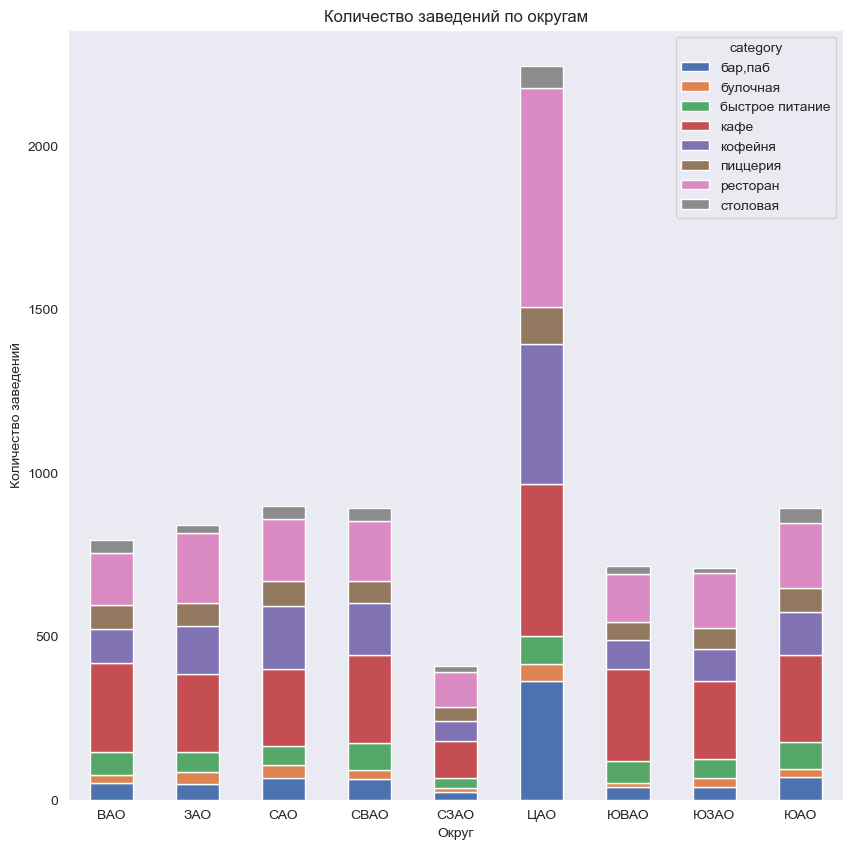

In [36]:
fig = pivot_district.plot(x='district', kind="bar", stacked=True, figsize=(10, 10))

plt.xlabel('Округ')
plt.ylabel('Количество заведений')
plt.title('Количество заведений по округам')
fig.set_xticklabels(fig.get_xticklabels(),rotation = 0)

plt.show(fig)

В ЦАО больше всего заведений общественного питания. Здесь господствуют рестораны, кафе, бары и кофейни. А вот в СЗАО суммарно заведений меньше 500. Во всех округах кроме ЦАО больше всего заведений из категории "кафе".

7) **Посмотрим на распределение средних рейтингов по категориям заведений.** 

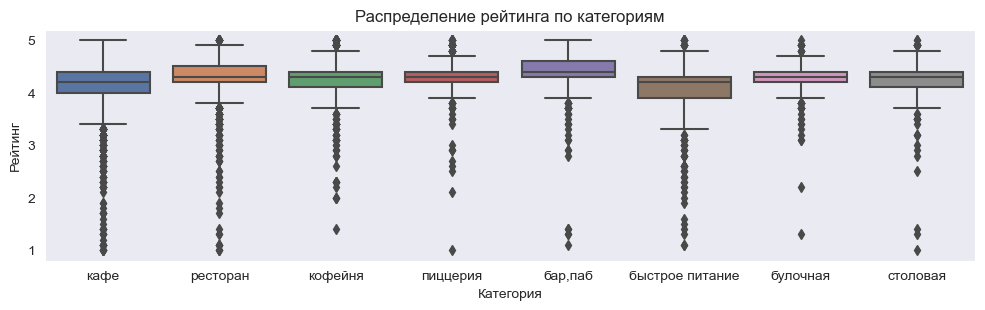

In [37]:
plt.figure(figsize=(12, 3)) 

fig = sns.boxplot(x='category', y='rating', data=data)

plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.title('Распределение рейтинга по категориям')

plt.show(fig)

Самый высокий средний рейтинг у баров и ресторанов, а наименьшее признание клиентов получают заведения быстрого питания и кафе. Можно сказать, что минимальное значение рейтинга по всем категориям не опускается ниже 3,5.

8) **Посмотрим на средний рейтинг заведений каждого района.**

In [38]:
pivot_rating = pd.pivot_table(data, index='district', values='rating', aggfunc='median').reset_index()
#pivot_rating['district'] = ['ВАО', 'ЗАО', 'САО', 'СВАО', 'СЗАО', 'ЦАО', 'ЮВАО', 'ЮЗАО', 'ЮАО']
pivot_rating

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [39]:
with open('admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
    geo_json = json.load(f)

In [40]:
path = '' # вставьте расположение файла на вашем компьютере
#state_geo = path + 'admin_level_geomap.geojson'
state_geo = geo_json
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=pivot_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.7,
    legend_name='Медианный рейтинг заведений по округам',
).add_to(m)

m

Значительных отличий по медианному рейтингу по округам не наблюдается. В ЦАО рейтинг чуть выше. Похоже, что клиентам важно не "где", а важно "как"!

9) **Отобразим все заведения на карте.**

In [41]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
data.apply(create_clusters, axis=1)
m

По карте видно, что в центре Москвы больше всего заведений общественного питания. Чем дальше от центра, тем меньше. Все логично.

10) **Найдем топ-15 улиц по количеству заведений.**

In [42]:
pivot_street = pd.pivot_table(data, index='street', columns='category', values='name', aggfunc='count').reset_index()
pivot_street = pivot_street.fillna(0)
pivot_street['total'] = pivot_street.loc[:, 'бар,паб': 'столовая'].apply(lambda x: sum(x), axis=1)
#pivot_street.sort_values('total', ascending=False).loc[:, 'street':'столовая'].head(15)

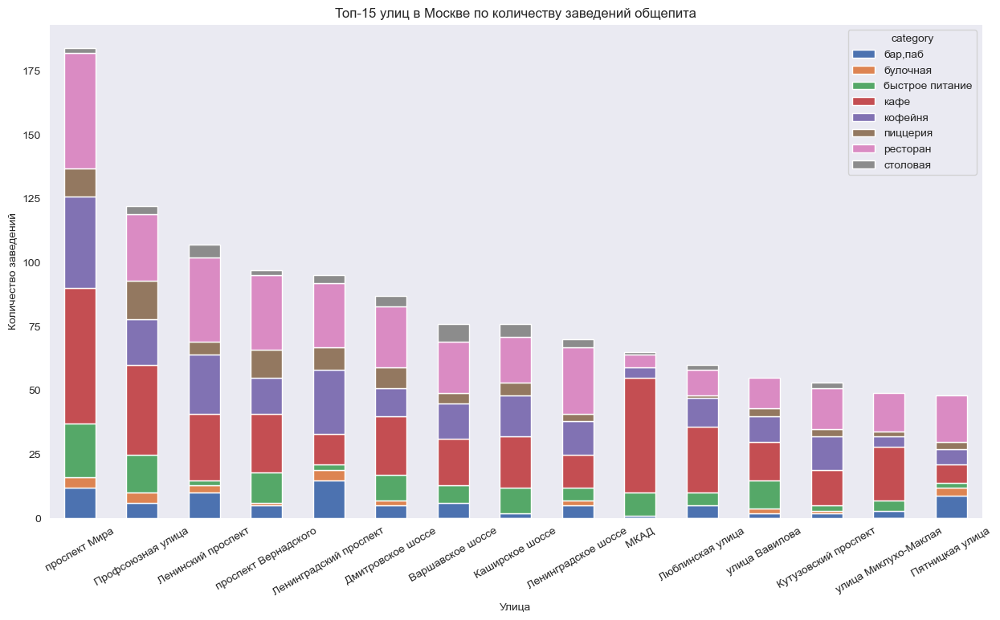

In [43]:
fig = pivot_street.sort_values('total', ascending=False).loc[:, 'street':'столовая'].head(15)\
      .plot(x='street', kind="bar", stacked=True, figsize=(15, 8))

plt.xlabel('Улица')
plt.ylabel('Количество заведений')
plt.title('Топ-15 улиц в Москве по количеству заведений общепита')
fig.set_xticklabels(fig.get_xticklabels(),rotation = 30)

plt.show(fig)

Всем на проспект Мира! Здесь более 175 разнообразных заведений. Каждый найдет что-то для себя.

11) **Найдем улицы, на которых находится только один объект общепита.**

In [44]:
pivot_street[pivot_street['total']==1][['street', 'total']]

category,street,total
0,1-й Автозаводский проезд,1.0
1,1-й Балтийский переулок,1.0
2,1-й Варшавский проезд,1.0
3,1-й Вешняковский проезд,1.0
5,1-й Голутвинский переулок,1.0
...,...,...
1436,улица Шкулёва,1.0
1437,улица Шкулёва 4,1.0
1439,улица Шухова,1.0
1442,улица Юннатов,1.0


После небольшого анализа становится понятно, что эти улицы расположены на приличном расстояния от центра Москвы. Также эти улицы не отличаются большой протяженностью. У предпринимателей при всем желании просто нет возможности открыть хотя бы несколько заведений на таких улицах. 

12) **Посчитаем медиану среднего чека для каждого района.**

In [45]:
median_bill_pivot = pd.pivot_table(data[data['middle_avg_bill']!=-1], index='district', values='middle_avg_bill', \
                                   aggfunc='median').reset_index()
#median_bill_pivot ['district'] = ['ВАО', 'ЗАО', 'САО', 'СВАО', 'СЗАО', 'ЦАО', 'ЮВАО', 'ЮЗАО', 'ЮАО']
median_bill_pivot 

,district,middle_avg_bill
0,Восточный административный округ,550
1,Западный административный округ,1000
2,Северный административный округ,650
3,Северо-Восточный административный округ,500
4,Северо-Западный административный округ,700
5,Центральный административный округ,1000
6,Юго-Восточный административный округ,450
7,Юго-Западный административный округ,600
8,Южный административный округ,500


In [46]:
path = '' # вставьте расположение файла на вашем компьютере
state_geo = path + '' # удалил
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=geo_json,
    data=median_bill_pivot ,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.7,
    legend_name='Медианный средний чек по округам',
).add_to(m)

m

Самый больщой средний чек в центре и на западе: 1000 рублей. Наименьшие значения на юге и на севере: около 500 рублей. Очевидно, что чем дальше от центра, тем меньше будет средний чек. Конечно, бывают исключения в виде далекорасположенных от центра премиальных ресторанов и т.д.

**Вывод**
<a id='conclusion'></a>

На этапе анализа данных было сделано много работы. Первым делом мы выяснили, какие категории заведений представлены в данных и сколько в среднем посадочных мест по категориям. Оказалось, что здесь лидируют рестораны и бары: в среднем около 50 посадочных мест. Затем мы вычислили, что в Москве соотношение несетевых и сетевых заведений общепита равно 60 на 40. Примечательно, что целых 60% всех булочных Москвы являются сетевыми. На следующем этапе, мы нашли топ-15 популярных сетей Москвы. Ожидаемо в первых рядах оказались "Шоколадница", "Домино'с Пицца" и "Додо Пицца". Последовав дальше, мы сгруппировали завдения по округам и провели несколько исследований. Получилось, что самый высокий средний чек в ЦАО и ЗАО. Также, проспект Мира оказался самой наполненной заведениями общепита улицей в Москве - около 175 точек! Подводя итог, стоит отметить, что средний рейтинг заведений незначительно отличается по округам: в ЦАО клиенты ставят 4,4. А в ЮВАО и СВАО по 4,2 звезды.

## Детализация исследования: открытие кофейни
<a id="detailing"></a>

1) **Посмотрим, сколько всего кофеен в датасете.**

In [47]:
data_coffee = data.loc[data['category']=='кофейня']
len(data_coffee)

1410

В данных представлено 1410 кофеен. Посмотрим на их расположение и средний рейтинг.

In [48]:
data_coffee_pivot = pd.pivot_table(data_coffee, index='district', values='rating', aggfunc='median').reset_index()
data_coffee_pivot

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.2
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [49]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    icon_url = 'https://img.icons8.com/ios-glyphs/512/coffee.png'
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

Choropleth(
    geo_data=geo_json,
    data=data_coffee_pivot,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.7,
    legend_name='Средний рейтинг кофеен',
).add_to(m)

data_coffee.apply(create_clusters, axis=1)
m

Ожидаемо, что в ЦАО больше всего кофеен. Что касается среднего рейтинга, то различий по округам нет. В ЗАО 4,2. В остальных округах 4,3.

2) **Поищем в данных круглосуточные кофейни.**

In [50]:
len(data_coffee[data_coffee['is_24/7']==True])

59

В Москве 59 кофеен, которые работают ежедневно и круглосуточно.

3) **Посчитаем, на какую стоимость чашки капучино стоит ориентироваться при открытии.**

In [51]:
data_coffee_price = pd.pivot_table(data_coffee[data_coffee['middle_coffee_cup']!=-1], index='district', \
                                values='middle_coffee_cup', aggfunc='median').reset_index()
data_coffee_price['district'] = ['ВАО', 'ЗАО', 'САО', 'СВАО', 'СЗАО', 'ЦАО', 'ЮВАО', 'ЮЗАО', 'ЮАО']
data_coffee_price['middle_coffee_cup'] = data_coffee_price['middle_coffee_cup'].astype('int')        
#data_coffee_price

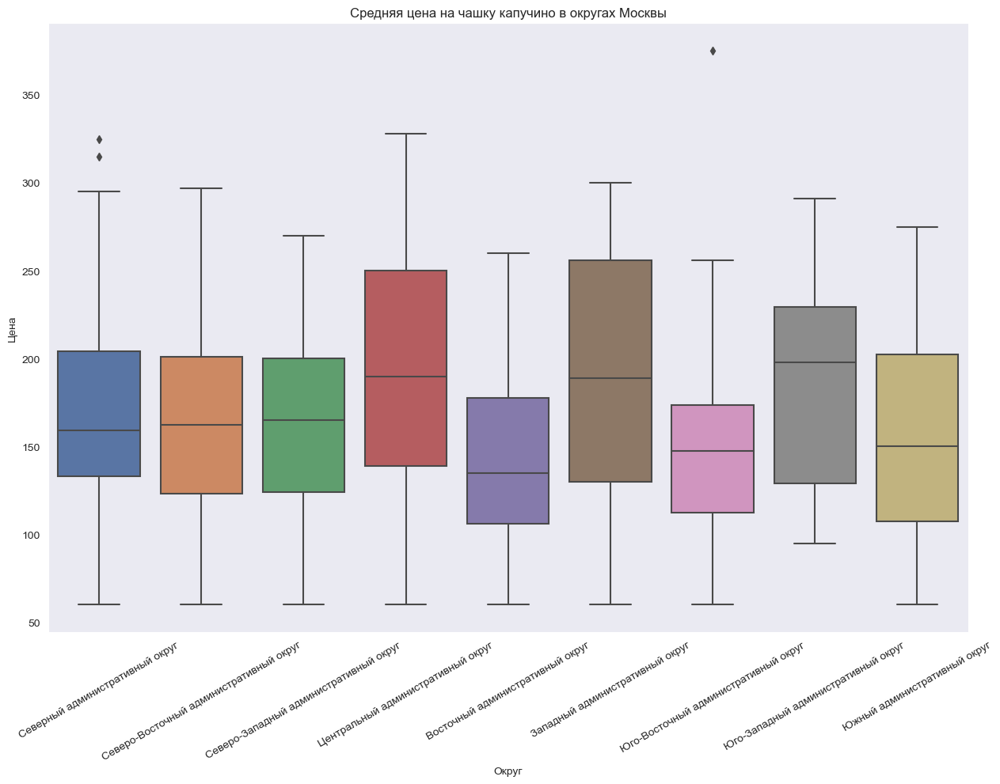

In [52]:
plt.figure(figsize=(15, 10)) 

fig = sns.boxplot(x='district', y='middle_coffee_cup', data=data_coffee[data_coffee['middle_coffee_cup']!=-1])

plt.xlabel('Округ')
plt.ylabel('Цена')
plt.title('Средняя цена на чашку капучино в округах Москвы')
fig.set_xticklabels(fig.get_xticklabels(),rotation = 30)

plt.show(fig)

Если открываемся в ЦАО, то ориентируемся на среднюю цену 200 рублей. Если в ВАО, то здесь средняя цена на капучино около 130 рублей. График наглядно отражает все квартили по каждому округу.

**Рекомендации**

При открытии кофейни стоит учитывать, что наша целевая аудитории в основном состоит из людей, которые утром едут на работу или учебу. Именно они будут составлять ядро нашей ЦА, на которое нужно ориентирвоаться. Как правило, вузы и офисы расположены в центре либо недалеко от него. Соотвественно, наша кофейня должна распологаться в этих же районах.<br>
Можно рассмотреть расположение около метро "Курская". Рядом два крупных университа: ГУЗ(4000 студентов, 500 преподавателей) и МИИГАиК(4000 студентов и 600 преподавателей). Также чуть южнее находится Нижний Сусальный переулок, на котором множество офисов и других заведений. Рассмотрим на карте.

In [53]:
guz_lat, guz_lng = 55.762875, 37.663728
m = Map(location=[guz_lat, guz_lng], zoom_start=16)

Marker([55.762875, 37.663728],\
              tooltip='Университет',
              popup='ГУЗ')\
              .add_to(m)

Marker([55.763675, 37.662602],\
              tooltip='Университет',
              popup='МИИГАиК')\
              .add_to(m)

Marker([55.759481, 37.665838],\
              tooltip='Офис',
              popup='Бизнес-центр')\
              .add_to(m)

Marker([55.758476, 37.664671],\
              tooltip='Офис',
              popup='Арма')\
              .add_to(m)
Marker([55.760060, 37.663165],\
              tooltip='Офис',
              popup='Ключ')\
              .add_to(m)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    icon_url = 'https://img.icons8.com/ios-glyphs/512/coffee.png'
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

data_coffee.apply(create_clusters, axis=1)
    
m

Посмотрим на информацию заведений в этой округе.

In [54]:
data_coffee[data_coffee['street']=='Нижний Сусальный переулок']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
4332,Omg Coffee,кофейня,"Москва, Нижний Сусальный переулок, 5, стр. 10",Центральный административный округ,"ежедневно, 10:00–22:00",55.760594,37.664190,4.4,высокие,Средний счёт:1500–2000 ₽,1750,-1,сетевое,55,Нижний Сусальный переулок,False
4375,One Price Coffee,кофейня,"Москва, Нижний Сусальный переулок, 5, стр. 1",Центральный административный округ,пн-пт 07:30–21:00; сб 08:00–20:00; вс 08:00–18:00,55.761355,37.663035,4.3,нет информации,нет информации,-1,-1,сетевое,95,Нижний Сусальный переулок,False
4397,7 Сэндвичей,кофейня,"Москва, Нижний Сусальный переулок, 5, стр. 2",Центральный административный округ,"пн-чт 08:00–23:00; пт 08:00–00:00; сб,вс 09:00...",55.760539,37.662345,4.1,средние,Средний счёт:100–500 ₽,300,-1,сетевое,38,Нижний Сусальный переулок,False
4433,One Special,кофейня,"Москва, Нижний Сусальный переулок, 5, стр. 11",Центральный административный округ,"пн-пт 08:00–20:00; сб,вс 11:00–20:00",55.760850,37.666404,4.2,нет информации,Цена чашки капучино:100–180 ₽,-1,140,сетевое,-1,Нижний Сусальный переулок,False
4497,Cofix,кофейня,"Москва, Нижний Сусальный переулок, 5, стр. 1",Центральный административный округ,"пн-пт 07:00–22:00; сб,вс 08:00–21:00",55.761264,37.662809,4.1,нет информации,Цена чашки капучино:от 60 ₽,-1,60,сетевое,95,Нижний Сусальный переулок,False
4572,Эль кафе,кофейня,"Москва, Нижний Сусальный переулок, 5, стр. 19",Центральный административный округ,"ежедневно, 07:00–20:00",55.759440,37.665688,4.1,низкие,Цена чашки капучино:99–179 ₽,-1,139,сетевое,80,Нижний Сусальный переулок,False


У большинства из них рейтинг ниже, чем средний по округу. У OMG Coffee высокие цены. Есть все шансы составить серьезную конкуренцию, если выходить с ценой чашки кофе около 100-120 рублей расплоложением ближе к университетам.

**Вывод**

Мы детализировали перспективу открытия кофейни. Проанализировали показатели кофеен по Москве. Оказалось, что по округам средний рейтинг сильно не отличается. Что не скажешь про средние цены на чашку капучино: скачки от 130 до 200 рублей. Затем было предложено расположение для открытия кофейни вблизи ВУЗов и бизнес-центров и проанализированы ближайшие конкуренты.

## Презентация
<a id="presentation"></a>

https://drive.google.com/file/d/1LubnhbkjthoASZezQPOxZFObFNVLG_ir/view?usp=sharing

Было проведено большое исследование. Сначала мы познакомились с данными и узнали, чтов нашем распоряжении 8 406 заведений общепита Москвы. На этапе предобработки данных были рассмотрены дубликаты, пропуски в данных и типы данных в столбцах. Также мы рассмотрели аномалии и избавились от них. Далее последовал анализ данных. Было проведено много исследований с подробным выводом [выше](#conclusion). Затем мы детализировали исследование и рассмотрели перспективу открытия кофейни. Оказалось, что при грамотном расположении и ценами это вполне реализуемо. В завершении была подготовлена презентация, в которой кратко представлен весь проект с выводами.